 
#**Group members : Harsh, Rutvik, Jay**

#**Project Name : Clustering Algoritham with python** 

##**1)Objective**



*   The main objective of this research work is to analyze and represent the various factors that have contributed to the Evolution of credit card transaction over time in Graphical Format and perform a comparative study between various factors.


*  Find the relationship between the credit limit with purchases and payments.   
*  Find the clusters in which data lies for the credit card data.


*  Find the different types of clustering techniques such as hierarchical clustering,  K-means, and sklearn. cluster, and kNN function.
*   For this project, Visa company is **Stakeholders** because they can easily understand the data based on our project and make important decisions easily.





Import required libraries such as pandas, NumPy, Matpltlib, and seaborn.

In [161]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px

Read the file using read_csv command

In [162]:
credit_data = pd.read_csv("CC GENERAL.csv")

In [163]:
credit_data.head(5)

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  TENURE
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787          0.000000      12
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217          0.222222      12
2  C10003  2495.148862           1.00000

##**2) Data Exploration**

Find the rows and column of the dataframe.

Rows = 8950

Column = 18 

In [87]:
credit_data.shape

(8950, 18)

Find all statistical parameters such as mean, median, max, min, quartiles, and count for understanding data.

In [88]:
credit_data.describe().T

                                   count         mean          std        min          25%          50%          75%          max
BALANCE                           8950.0  1564.474828  2081.531879   0.000000   128.281915   873.385231  2054.140036  19043.13856
BALANCE_FREQUENCY                 8950.0     0.877271     0.236904   0.000000     0.888889     1.000000     1.000000      1.00000
PURCHASES                         8950.0  1003.204834  2136.634782   0.000000    39.635000   361.280000  1110.130000  49039.57000
ONEOFF_PURCHASES                  8950.0   592.437371  1659.887917   0.000000     0.000000    38.000000   577.405000  40761.25000
INSTALLMENTS_PURCHASES            8950.0   411.067645   904.338115   0.000000     0.000000    89.000000   468.637500  22500.00000
CASH_ADVANCE                      8950.0   978.871112  2097.163877   0.000000     0.000000     0.000000  1113.821139  47137.21176
PURCHASES_FREQUENCY               8950.0     0.490351     0.401371   0.000000     0.083333

Check the types of the different parameters.

Found that every column has the proper type.

In [89]:
credit_data.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

Print the name of all columns

**CUST ID**: Id of Credit Card holder 

**BALANCE**: Balance amount left in their account 

**BALANCE FREQUENCY**: How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)

**PURCHASES**: Amount of purchases 

**ONE-OFF PURCHASES**: Maximum purchase amount done in one-go

**INSTALLMENTS PURCHASES**: Amount of purchase done in installment

**CASH ADVANCE**: Cash in advance given by the user

**PURCHASES FREQUENCY**: How frequently the Purchases are being made score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)

**ONE-OFF PURCHASES FREQUENCY**: How frequently Purchases are happening in one go (1 = frequently purchased, 0 = not frequently purchased)

**PURCHASES INSTALLMENTS FREQUENCY**: How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)

**CASH ADVANCE FREQUENCY**: How frequently is the cash in advance being paid

**CASH ADVANCE TRX**: Number of Transactions made with Cash in Advance

**PURCHASES TRX**: Number of purchase transactions made

**CREDIT LIMIT**: Limit of Credit Card 

**PAYMENTS**: Amount of Payment done by the user

**MINIMUM_PAYMENTS**: Minimum amount of payments made by the user

**PRC FULL PAYMENT**: Percent of full payment paid by the user

**TENURE**: Tenure of credit card service

In [90]:
credit_data.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'], dtype='object')

## **3) Data Cleaning**

Find the data which has null value by using the isna function.

And found that minimum_payments has 313 null value.

In [91]:
pd.isna(credit_data).sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

Remove null value by passing 0 value.

In [92]:
credit_data=credit_data.fillna(0)

In [93]:
credit_data.head()

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  TENURE
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787          0.000000      12
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217          0.222222      12
2  C10003  2495.148862           1.00000

In [94]:
pd.isna(credit_data).sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

drop the customer id and prc full payment means percentage of the full payment in the data

In [95]:
credit_data.drop

<bound method DataFrame.drop of      CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  TENURE
0     C10001    40.900749           0.818182      95.40              0.00                   95.40      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787          0.000000      12
1     C10002  3202.467416           0.909091       0.00              0.00                    0.00   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217          0.222222      12

In [96]:
credit_data.drop(['TENURE','PRC_FULL_PAYMENT'], axis=1,inplace = True)

In [97]:
credit_data.head()

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217
2  C10003  2495.148862           1.000000     773.17            773.17                     0.0      0.000000          

## **4) Adaptation**

Add a column about whether that customer is a regular customer or HNI.

If the customer's bank balance is more than 2000, the customer is HNI otherwise, the customer is regular.



In [98]:
credit_data["High_net_indi"] = 0

In [99]:
for i in range(0,8950):
  if credit_data.iloc[i,2] >= 2000:
    credit_data.iloc[i,16] = "HNI"
  else:
    credit_data.iloc[i,16] = "Regular customer"


In [100]:
credit_data[credit_data.iloc[:,2] <= 2000].head(3)

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS     High_net_indi
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                         0.0                          0.083333                    0.00                 0              2        1000.0   201.802084        139.509787  Regular customer
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                         0.0                          0.000000                    0.25                 4              0        7000.0  4103.032597       1072.340217  Regular customer
2  C10003  2495.148862           1.000000     773.17            

Add new column about discount.

Provide a discount to a customer when the purchase is more than  5000, so the discount is 500.

If the purchase is more than 10000, so a discount is 1000.

If the purchase is more than 20000 so, a discount is 2000.

In [101]:
credit_data['Discount'] = 0

In [102]:

for i in range(0,8950):
  if credit_data.iloc[i,4] >= 20000:
    discount = 2000
    credit_data.iloc[i,17] = 2000
  elif credit_data.iloc[i,4] >= 10000:
    discount = 1000
    credit_data.iloc[i,17] = 1000
  elif credit_data.iloc[i,4] >= 5000:
    discount = 500
    credit_data.iloc[i,17] = 500
  

In [103]:
credit_data[credit_data.iloc[:,4] >= 20000].head(3)

    CUST_ID       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS     High_net_indi  Discount
273  C10284   5131.319584                1.0   32539.78          26547.43                 5992.35           0.0             1.000000                    1.000000                          1.000000                     0.0                 0             98       11500.0  26652.34432       1971.129435  Regular customer      2000
501  C10523  13479.288210                1.0   41050.40          40624.06                  426.34           0.0             0.833333                    0.666667                          0.416667                     0.0                 0            157       17000.0  36066.75068      15914.484620  Regular customer      2000
507  C10529   2643.343414

In [104]:
credit_data.head(10)

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS     High_net_indi  Discount
0  C10001    40.900749           0.818182      95.40              0.00                   95.40      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787  Regular customer         0
1  C10002  3202.467416           0.909091       0.00              0.00                    0.00   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217  Regular customer         0
2  C10003  2495.148862           1

## **5)Descriptive Visualization:** 





plot the histogram of the purchases, purchases frequency, balnace, oneoff purchases frequency, cash advance frequency and, purchases installments frequency.

In advance frequency histogram shows that most customers do not like to pay in advance.

In the frequency of purchase installment, the histogram shows that most of the customers pay a monthly installment.

In purchase frequency, the histogram shows that most of the customers are just started using a credit card. whereas, most of the customers are regular customers.

In onoff purchases, the frequency histogram shows that most of the customers do not like purchasing in one go.

In purchases, the histogram shows that most of the customer's purchase amount to less than 5000.

In balances, the histogram shows that most of the customer's balance amount is in the range of 0 to 5000.










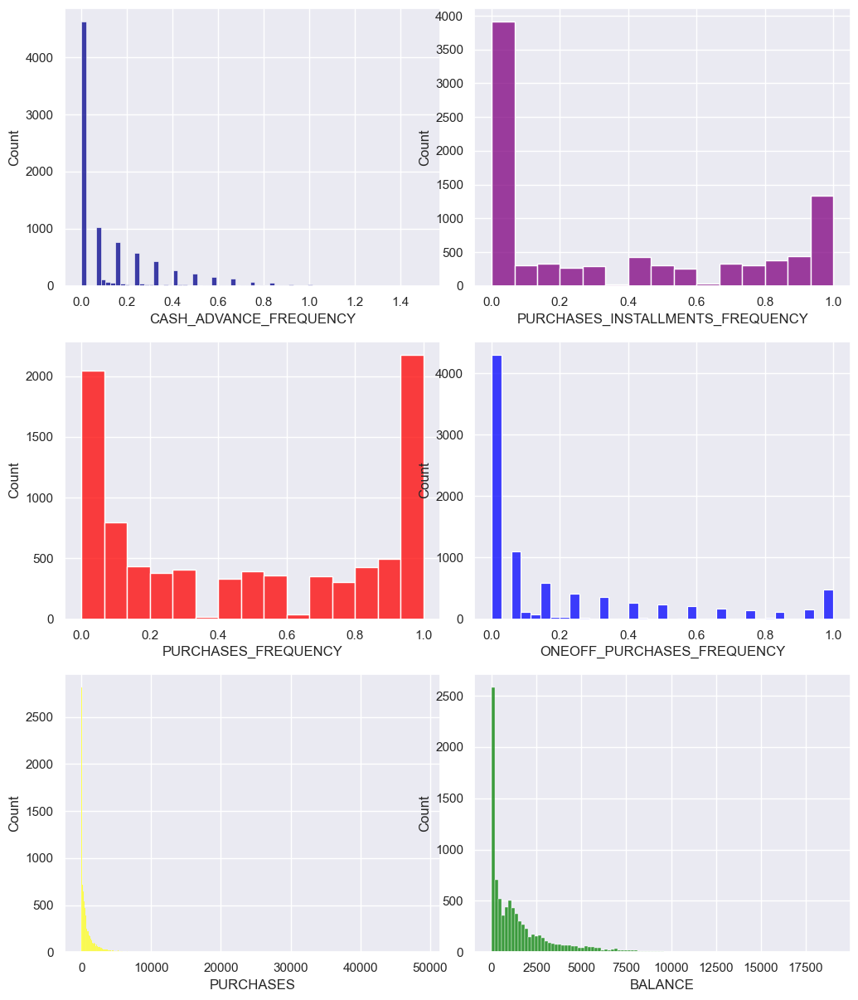

In [105]:
sns.set(rc={'figure.figsize':(25,20)})
ax1 = plt.subplot2grid((4,8), (0,1), colspan=2)
ax2 = plt.subplot2grid((4,8), (0,3), colspan=2)
ax3 = plt.subplot2grid((4,8), (1,1), colspan=2)
ax4 = plt.subplot2grid((4,8), (1,3), colspan=2)
ax5 = plt.subplot2grid((4,8), (2,1), colspan=2)
ax6 = plt.subplot2grid((4,8), (2,3), colspan=2)
sns.set_theme(palette="Accent")
sns.histplot(data = credit_data,x = "PURCHASES",ax=ax5, color='yellow')
sns.histplot(data = credit_data,x = "PURCHASES_FREQUENCY",ax=ax3, color='red')
sns.histplot(data = credit_data,x = "BALANCE",ax=ax6, color='green')
sns.histplot(data = credit_data,x = "ONEOFF_PURCHASES_FREQUENCY",ax=ax4, color='blue')
sns.histplot(data = credit_data,x = "CASH_ADVANCE_FREQUENCY",ax=ax1, color='darkblue')
sns.histplot(data = credit_data,x = "PURCHASES_INSTALLMENTS_FREQUENCY",ax=ax2, color='purple');

These scatter plot shows that most customers have a credit limit of up to 20000, and payment is near up to 10000. whereas, in some cases, customers have credit limits of up to 30000. 

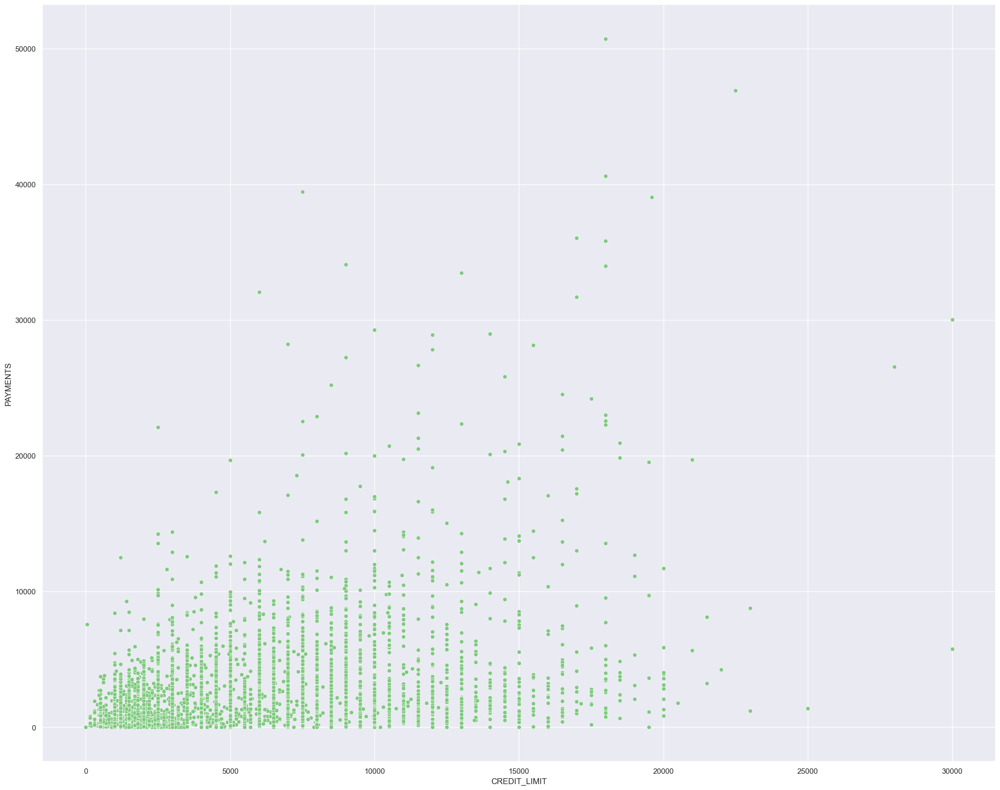

In [106]:
sns.scatterplot(x=credit_data["CREDIT_LIMIT"],y=credit_data["PAYMENTS"]);
sns.set(rc={'figure.figsize':(6,9)})
           

Using the px function, plot the scatter plot for purchases and purchase frequency and customer id plots with a different color.

In this way, select any customer id and show what the purchase amount and purchase frequency are.

In [107]:
px.scatter(data_frame = credit_data
           ,x = 'PURCHASES'
           ,y = 'PURCHASES_FREQUENCY'
           ,color = 'CUST_ID'
           )

Plot the correlation using a heatmap.

The histogram shows that only Purchases and Onoff purchase frequency are related. whereas, the other columns are not corelated in this histogram.

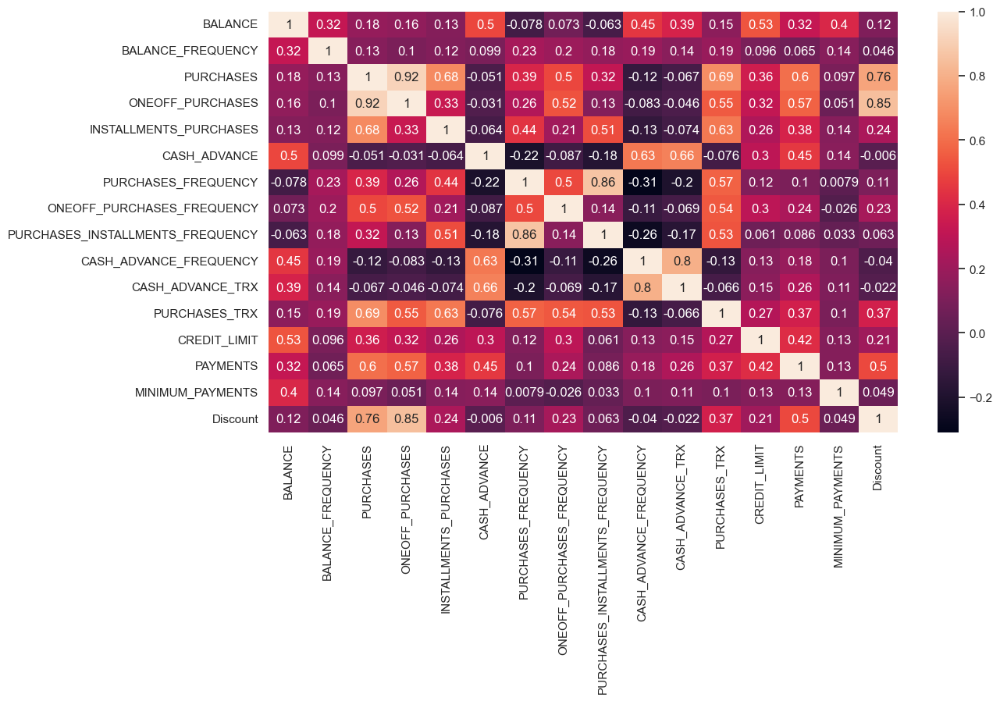

In [108]:
plt.figure(figsize=(13, 7))
sns.heatmap(credit_data.corr(), annot=True);

In the credit limit, the box plot shows that the median credit limit is around 3000. whereas, the third quartile is nearly 7000.

There are many outliers in this data up to 30000. 

/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



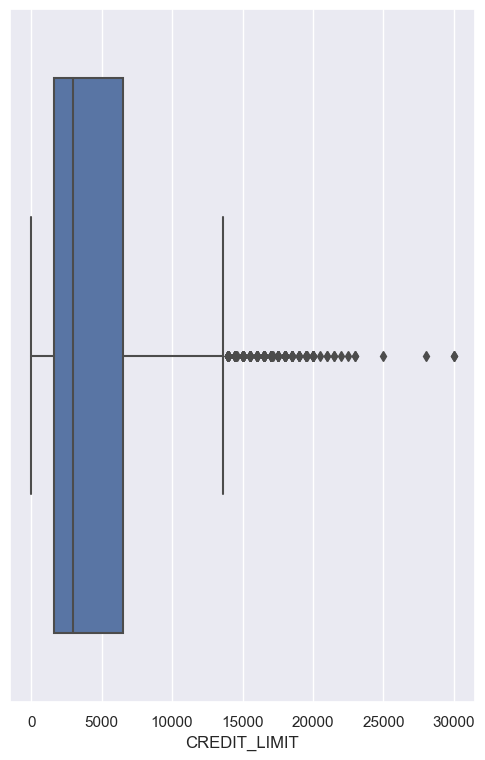

In [109]:
sns.boxplot(credit_data['CREDIT_LIMIT']);
sns.set(rc={'figure.figsize':(8,10)});

# **Cluster Analysis**

### **6)Step-by-step hierarchical clustering:**

Take sample of data to find step-by-step hierarchical clustering 

Make a new dataframe contain customer id, purchases, credit limit ,and balance.

In [110]:
from sklearn.cluster import AgglomerativeClustering

In [111]:
cl = credit_data[['CREDIT_LIMIT','PAYMENTS']]

In [112]:
cluster = AgglomerativeClustering(n_clusters =4, affinity = 'euclidean', linkage  = 'ward')

In [113]:
clc_pre = cluster.fit_predict(cl)

In [114]:
credit_data['cluster']=clc_pre

In [115]:
credit_data[['CREDIT_LIMIT','PURCHASES','cluster']].head()

   CREDIT_LIMIT  PURCHASES  cluster
0        1000.0      95.40        1
1        7000.0       0.00        0
2        7500.0     773.17        0
3        7500.0    1499.00        0
4        1200.0      16.00        1

Import AgglomerativeClustering from sklearn.cluster select two column credit_limit and payments for clustering then fit the cluster.

In [116]:
df1 = credit_data[credit_data.cluster == 0]
df2 = credit_data[credit_data.cluster == 1]
df3 = credit_data[credit_data.cluster == 2]
df4 = credit_data[credit_data.cluster == 3]

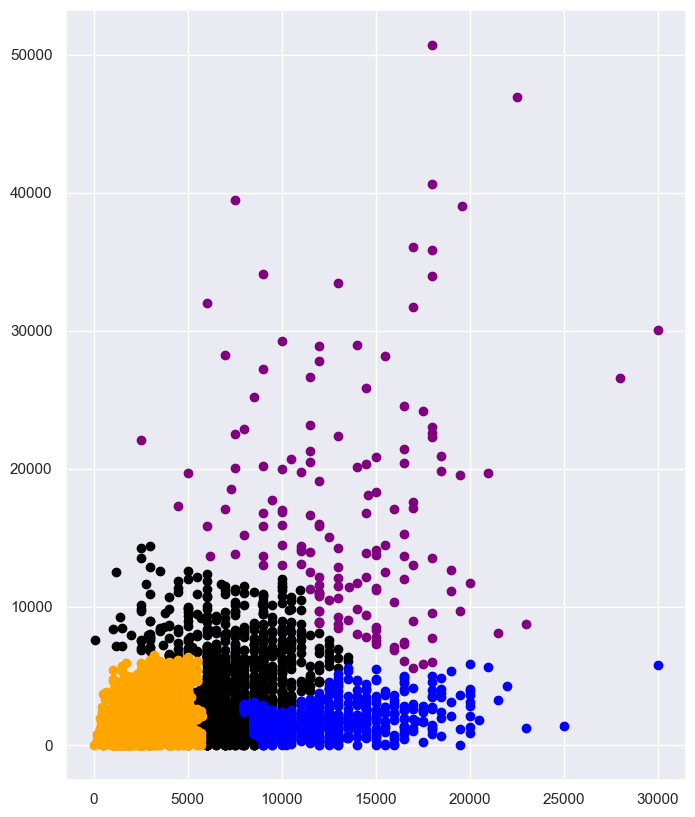

In [117]:
plt.scatter(df1['CREDIT_LIMIT'],df1['PAYMENTS'],color ='black')
plt.scatter(df2['CREDIT_LIMIT'],df2['PAYMENTS'],color ='orange')
plt.scatter(df3['CREDIT_LIMIT'],df3['PAYMENTS'],color ='purple')
plt.scatter(df4['CREDIT_LIMIT'],df4['PAYMENTS'],color ='blue');

## **7)Dendogram**

for plot the dendogram import dendrogram,linkage and leaves_ list from the scipy cluster hierarchy.
we take sample data to plot the dendogram to allocate objects to clusters in dendogram.


In [118]:
u_updated_credit_data = credit_data.drop(['CUST_ID','High_net_indi'],axis =1)

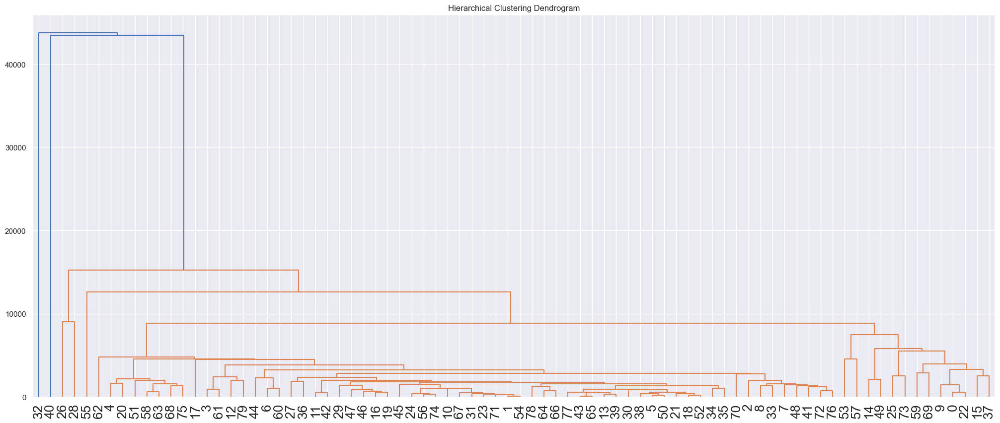

In [119]:
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list
Z = linkage(u_updated_credit_data.sample(80), 'average')


plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
dendrogram(Z, leaf_font_size = 19.)
plt.show()

# **8)Unsupervised Clustering**

# step-by-step k-means

decide to use 3 centroid for the data and select random points.



In [120]:
centroid1 = np.array([8000,7000])
centroid2 = np.array([15000, 17000])
centroid3 = np.array([17000, 30000])
print(centroid1, centroid2, centroid3)

[8000 7000] [15000 17000] [17000 30000]


plot the scatter plot for the credit card  limit and payments columns.
and plot the 3 centroid in the scatter plot. 

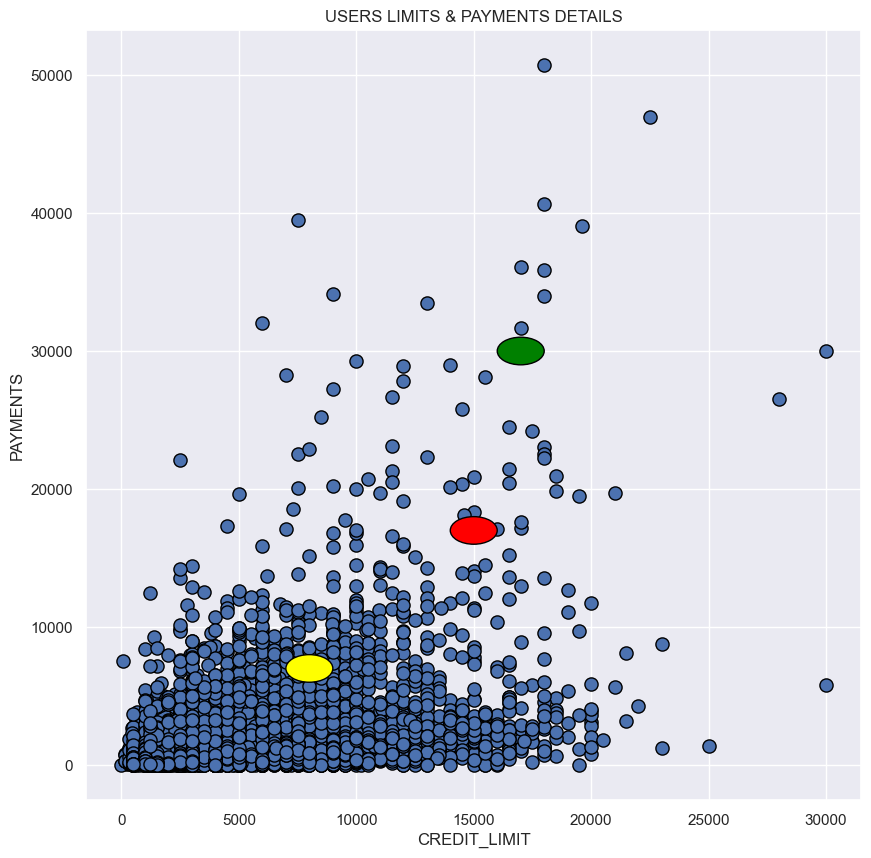

In [121]:
fig = plt.figure(figsize=(10,10))

plt.scatter(credit_data.CREDIT_LIMIT, credit_data.PAYMENTS, edgecolor = 'black', s = 90)
plt.title('USERS LIMITS & PAYMENTS DETAILS')
plt.xlabel('CREDIT_LIMIT')
plt.ylabel('PAYMENTS')
circle1 = plt.Circle(centroid1, radius=1000, edgecolor = 'black', fc='yellow')
circle2 = plt.Circle(centroid2, radius=1000, edgecolor = 'black', fc='red')
circle3 = plt.Circle(centroid3, radius=1000, edgecolor = 'black', fc='green')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)


In [122]:
credit_data.head()

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS     High_net_indi  Discount  cluster
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787  Regular customer         0        1
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217  Regular customer         0        0
2  C100

Import make_blobs from sklearn.cluster.

make blobs with sample of 120 and with the centers of 4.

For finding kmenas import KMenas from sklearn.cluster.






In [123]:
 from sklearn.datasets import make_blobs

In [124]:
dataset = make_blobs(n_samples=120, centers=4,
                       cluster_std=0.40, random_state=0)

In [125]:
points = dataset[0]

In [126]:
from sklearn.cluster import KMeans

In [127]:
kmeans = KMeans(n_clusters=4)

remove the null values from the datsets.

In [128]:
np.isnan(credit_data.any()) #and gets False
np.isfinite(credit_data.all()) #and gets True

CUST_ID                             True
BALANCE                             True
BALANCE_FREQUENCY                   True
PURCHASES                           True
ONEOFF_PURCHASES                    True
INSTALLMENTS_PURCHASES              True
CASH_ADVANCE                        True
PURCHASES_FREQUENCY                 True
ONEOFF_PURCHASES_FREQUENCY          True
PURCHASES_INSTALLMENTS_FREQUENCY    True
CASH_ADVANCE_FREQUENCY              True
CASH_ADVANCE_TRX                    True
PURCHASES_TRX                       True
CREDIT_LIMIT                        True
PAYMENTS                            True
MINIMUM_PAYMENTS                    True
High_net_indi                       True
Discount                            True
cluster                             True
dtype: bool

select the numeric columns from the data.

In [129]:
x = credit_data.iloc[ : , 1:13]

In [130]:
kmeans.fit(x)

KMeans(n_clusters=4)

In [131]:
kmeans.labels_

array([0, 1, 0, ..., 0, 0, 0], dtype=int32)

plot the KMeans classification  using the scatter plot for the purchases and purchases frequency.

Text(0, 0.5, 'PURCHASES_FREQUENCY')

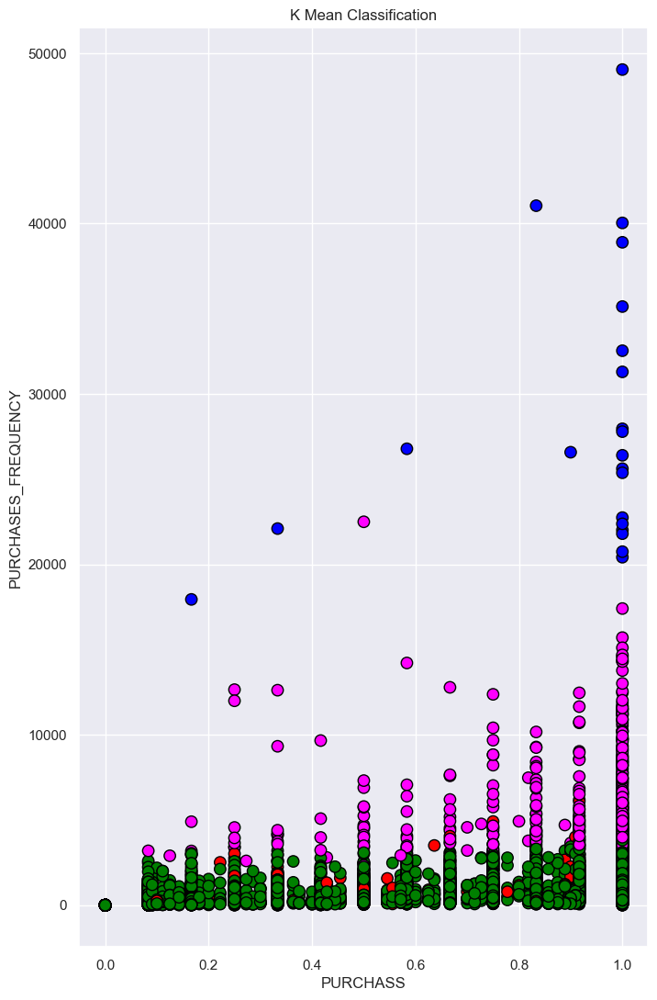

In [132]:
fig = plt.figure(figsize=(8, 13))
colormap = np.array(['green', 'red', 'blue','magenta','black'])
 
plt.scatter(x.PURCHASES_FREQUENCY, x.PURCHASES,c = colormap[kmeans.labels_], edgecolor = 'black', s=80)
plt.title('K Mean Classification')
plt.xlabel('PURCHASS')
plt.ylabel('PURCHASES_FREQUENCY')

plot the kmeans four different clusters. 

In [133]:
clusters = kmeans.cluster_centers_

In [134]:
print(clusters)

[[8.94422232e+02 8.55163052e-01 6.10121940e+02 3.09709112e+02
  3.00685549e+02 4.31797717e+02 4.81657254e-01 1.69810902e-01
  3.58144038e-01 9.78363640e-02 2.00318295e+00 1.09868530e+01]
 [5.17272254e+03 9.66444280e-01 5.81851909e+02 3.34496371e+02
  2.47415529e+02 4.78561083e+03 3.19561219e-01 1.45745998e-01
  2.25278073e-01 4.14781650e-01 1.21612903e+01 1.00519713e+01]
 [5.60164463e+03 9.54132227e-01 2.83941623e+04 2.28584573e+04
  5.53570500e+03 1.01420640e+03 9.00757545e-01 8.43181864e-01
  6.95454500e-01 4.16666364e-02 1.86363636e+00 1.26090909e+02]
 [2.80368622e+03 9.77170735e-01 5.62444338e+03 3.73408263e+03
  1.89146826e+03 4.73842877e+02 9.07397795e-01 6.88976375e-01
  6.94633205e-01 6.61468259e-02 1.68771331e+00 6.53071672e+01]]


## **Prediction**

In [135]:
y_km = kmeans.fit_predict(x)
X = np.array(x)

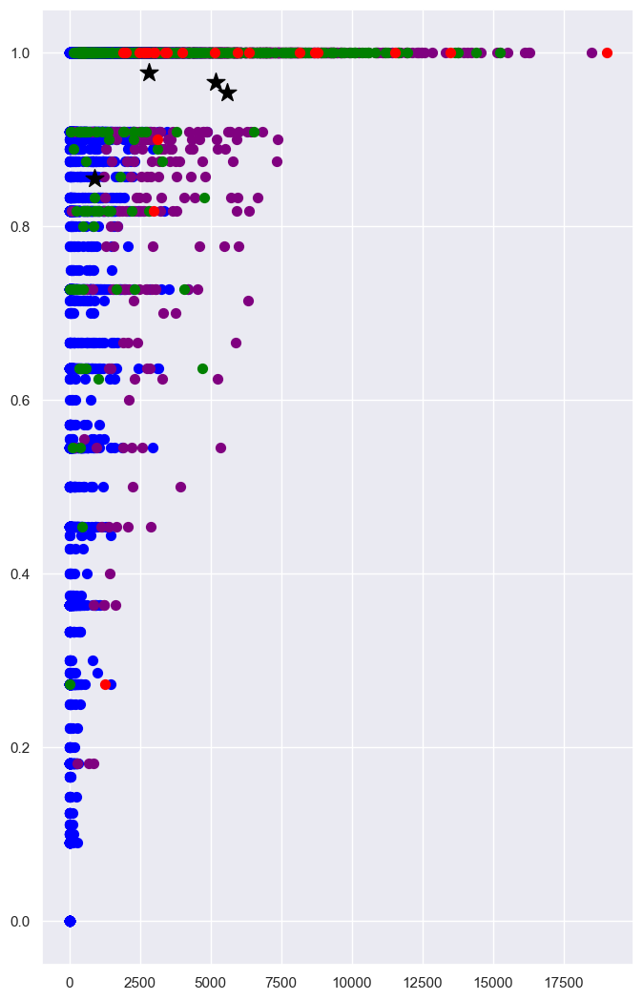

In [136]:
fig = plt.figure(figsize=(8, 13))
plt.scatter(X[y_km == 0,0], X[y_km == 0,1], s=50, color='blue', label='Cluster0')
plt.scatter(X[y_km == 1,0], X[y_km == 1,1], s=50, color='purple', label='Cluster1')
plt.scatter(X[y_km == 2,0], X[y_km == 2,1], s=50, color='green', label='Cluster2')
plt.scatter(X[y_km == 3,0], X[y_km == 3,1], s=50, color='red', label='Cluster3')

plt.scatter(clusters[0][0], clusters[0][1], marker='*', s=200, color='black')
plt.scatter(clusters[1][0], clusters[1][1], marker='*', s=200, color='black')
plt.scatter(clusters[2][0], clusters[2][1], marker='*', s=200, color='black')
plt.scatter(clusters[3][0], clusters[3][1], marker='*', s=200, color='black')
plt.show()

# **9)sklearn.cluster**

Import cluster and metrics from sklearn.


In [137]:
import sklearn.cluster as cluster
import sklearn.metrics as metrics

Import KNeighborsClassifier from sklearn.neighbors.



In [138]:
from sklearn.neighbors import KNeighborsClassifier

Find the kmeans of the clusters for 4 clusters. and
 fit the kmeans with purchases and purchses frequency. 

In [139]:
kmeans = cluster.KMeans(n_clusters=4, init="k-means++").fit(X)
kmeans =kmeans.fit(x[['PURCHASES','PURCHASES_FREQUENCY']])

Find the sklearn cluster with the cluster center and plot the scatter plot for purchases installment frequency and cash advance frequency for the difference ranges of balances.

In [140]:
skcluster= kmeans.cluster_centers_

In [141]:
skcluster

array([[3.80142525e+02, 4.08739112e-01],
       [2.84118362e+03, 8.65032184e-01],
       [2.86012077e+04, 9.15909045e-01],
       [8.47365443e+03, 9.26444251e-01]])

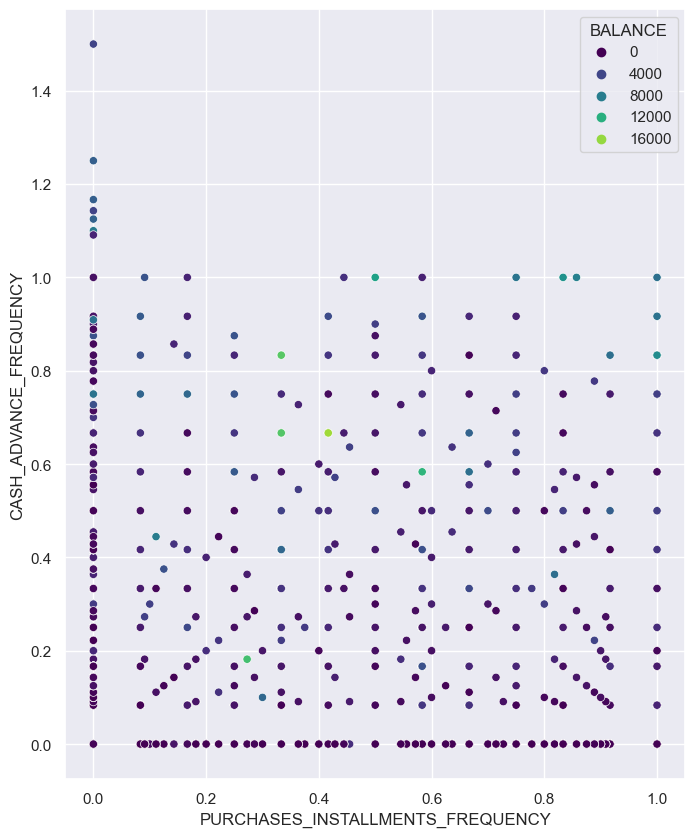

In [142]:
sns.scatterplot(x="PURCHASES_INSTALLMENTS_FREQUENCY", y="CASH_ADVANCE_FREQUENCY", hue = 'BALANCE',  data=x, palette='viridis');

## 10) KNN algorithm

import essential library such as matplotlib, KMeans and sklearn metrics.

In [143]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import datasets
from sklearn.cluster import KMeans
import sklearn.metrics as sm
 
import pandas as pd
import numpy as np
from pandas import DataFrame

# Set some pandas options
pd.set_option('display.notebook_repr_html', False)
pd.set_option('display.max_rows', 60)
pd.set_option('display.max_columns', 60)
pd.set_option('display.width', 1000)
 
%matplotlib inline

convert purchase frequency into the 0,1,2,3.

In [144]:
credit_data['convert_purchase'] = 0
for i in range(0,8950):
  if credit_data.iloc[i,7] >= 0.75:
    credit_data.iloc[i,18] = 3
  elif credit_data.iloc[i,7] >= 0.50:
    credit_data.iloc[i,18] = 2  
  elif credit_data.iloc[i,7] >= 0.25:
    credit_data.iloc[i,18] = 1   
  else:
    credit_data.iloc[i,18] = 0

In [145]:
credit_data.head()

  CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT     PAYMENTS  MINIMUM_PAYMENTS     High_net_indi  Discount  cluster  convert_purchase
0  C10001    40.900749           0.818182      95.40              0.00                    95.4      0.000000             0.166667                    0.000000                          0.083333                0.000000                 0              2        1000.0   201.802084        139.509787  Regular customer         0        0                 0
1  C10002  3202.467416           0.909091       0.00              0.00                     0.0   6442.945483             0.000000                    0.000000                          0.000000                0.250000                 4              0        7000.0  4103.032597       1072.340217  Regular

In [146]:
credit_data.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
High_net_indi                        object
Discount                              int64
cluster                               int64
convert_purchase                      int64
dtype: object

Plot the 

In [147]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 5, 
                           p = 2)# p=2 for euclidean distance
knn.fit(credit_data[["PURCHASES", "BALANCE"]], 
        credit_data.convert_purchase)

KNeighborsClassifier()

In [148]:
credit_data['convert_purchase'] = 0
for i in range(0,8950):
  if credit_data.iloc[i,7] >= 0.75:
    credit_data.iloc[i,19] = 3
  elif credit_data.iloc[i,7] >= 0.50:
    credit_data.iloc[i,19] = 2  
  elif credit_data.iloc[i,7] >= 0.25:
    credit_data.iloc[i,19] = 1   
  else:
    credit_data.iloc[i,19] = 0

In [149]:
fig = plt.figure(figsize=(5,5))


<Figure size 500x500 with 0 Axes>

Text(0, 0.5, 'Purchases')

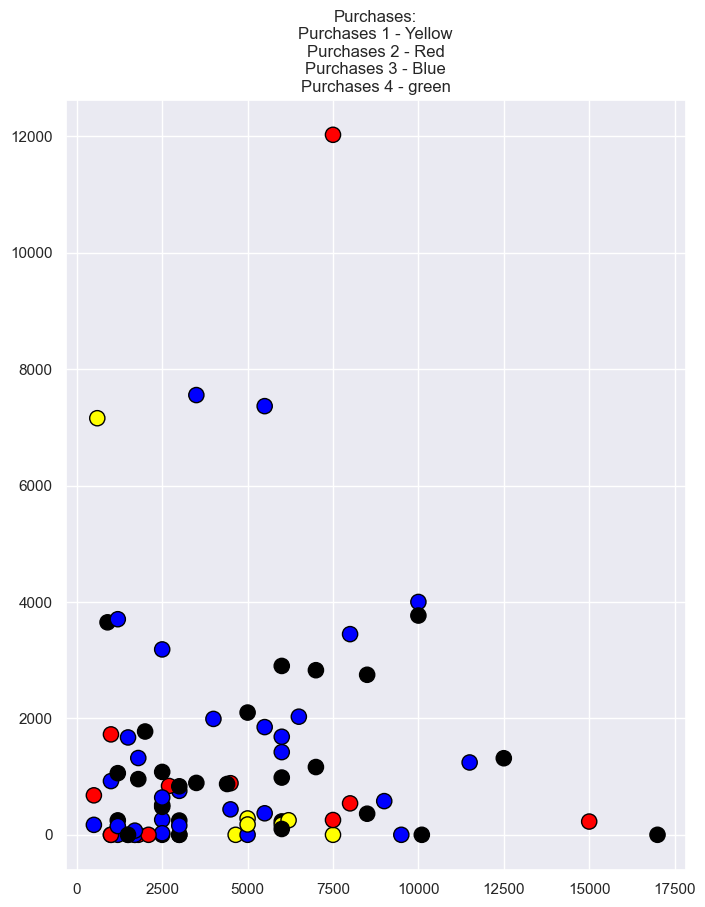

In [150]:
colormap = np.array(['black', 'yellow', 'red', 'blue', 'green'])
 
plt.scatter(credit_data.sample(80).CREDIT_LIMIT,credit_data.sample(80).PURCHASES, 
            c = colormap[credit_data.sample(80).convert_purchase], edgecolor = 'black', s = 120)
plt.title('Purchases:\nPurchases 1 - Yellow\nPurchases 2 - Red\nPurchases 3 - Blue\nPurchases 4 - green')
ax = fig.add_subplot(111)
ax.set_xlabel('Credit Limit')
ax.set_ylabel('Purchases')

In [151]:
fig = plt.figure(figsize=(8,7))

<Figure size 800x700 with 0 Axes>

Text(0, 0.5, 'Purchases')

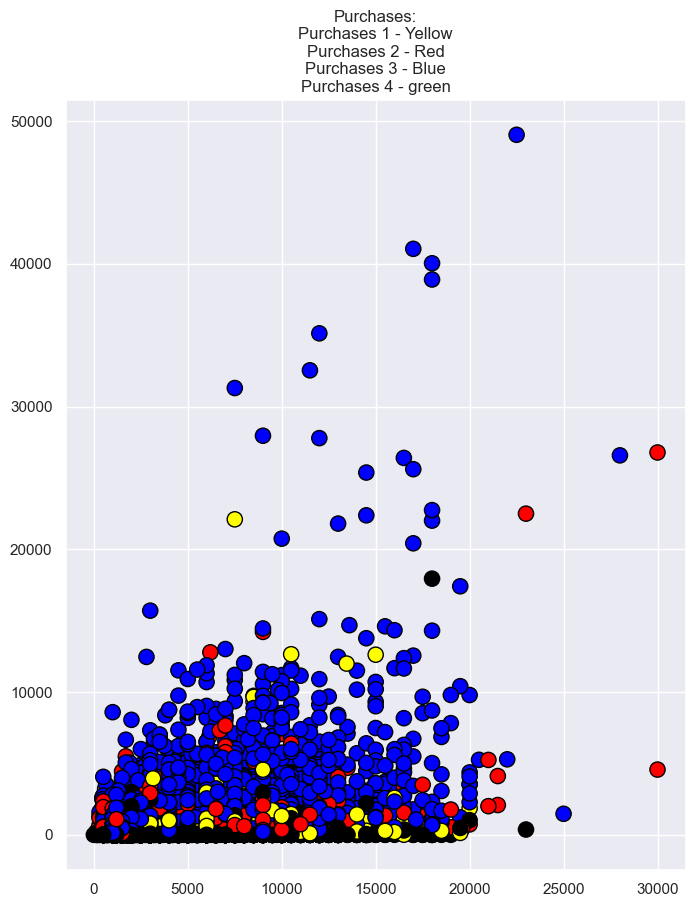

In [152]:
colormap = np.array(['black', 'yellow', 'red', 'blue', 'green'])
 
plt.scatter(credit_data.CREDIT_LIMIT,credit_data.PURCHASES, 
            c = colormap[credit_data.convert_purchase], edgecolor = 'black', s = 120)
plt.title('Purchases:\nPurchases 1 - Yellow\nPurchases 2 - Red\nPurchases 3 - Blue\nPurchases 4 - green')
ax = fig.add_subplot(111)
ax.set_xlabel('Credit Limit')
ax.set_ylabel('Purchases')

In [153]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 5, 
                           p = 2)# p=2 for euclidean distance
knn.fit(credit_data[["CREDIT_LIMIT", "PURCHASES"]], 
        credit_data.convert_purchase)

KNeighborsClassifier()

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names



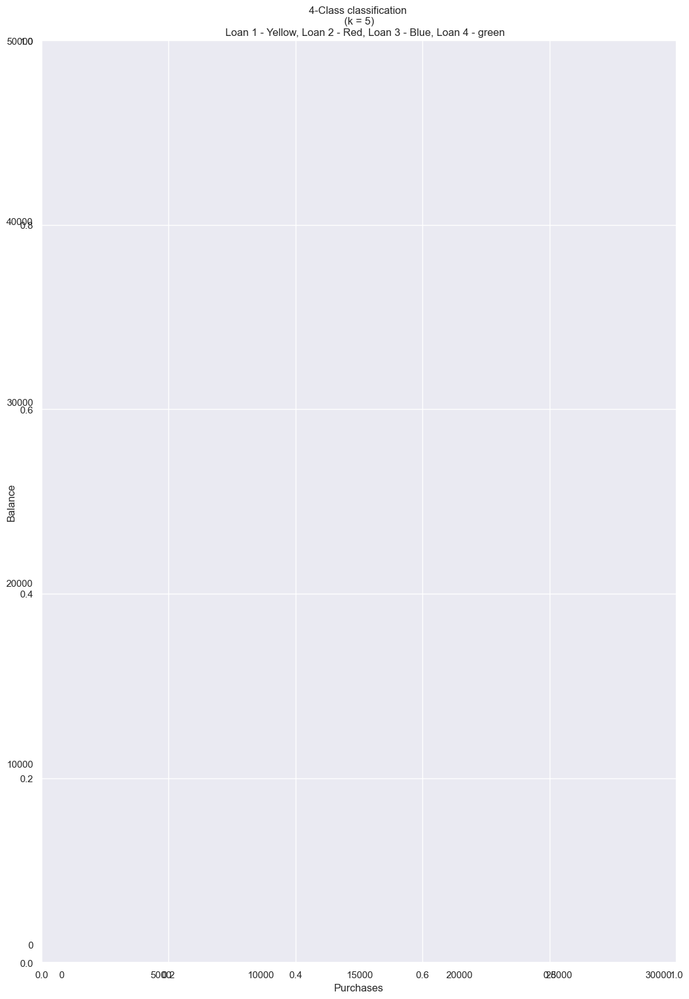

In [154]:
def plotMesh():
    h = 100 
    # Create color maps
    cmap_light = ListedColormap(['#ffffb3', '#ff9999','#d6d6f5','#ccffdd'])
    colormap = np.array(['black', 'yellow', 'red', 'blue', 'green'])
     
    x_min, x_max = credit_data.CREDIT_LIMIT.min() - 1000, credit_data.CREDIT_LIMIT.max() + 1000
    y_min, y_max = credit_data.PURCHASES.min() - 1000, credit_data.PURCHASES.max() + 1000
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h))
    Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    fig = plt.figure(figsize=(13,19))
    plt.pcolormesh(xx, yy, Z, cmap = cmap_light)
    # Plot also the training points
    plt.scatter(credit_data.CREDIT_LIMIT, credit_data.PURCHASES, c = colormap[credit_data.convert_purchase], edgecolor = 'black', 
                s = 120)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("4-Class classification \n(k = %i)\n\
    Loan 1 - Yellow, Loan 2 - Red, Loan 3 - Blue, Loan 4 - green" % (5))
    ax = fig.add_subplot(111)
    ax.set_xlabel('Purchases')
    ax.set_ylabel('Balance')
plotMesh()

## **Report**


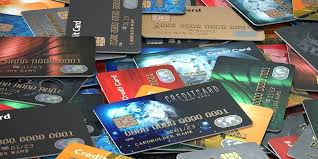

This Report is created by Group of 9 analytical computing.
For this project, Visa company is ours ** Stakeholder** because they can easily understand the data based on our project and make important decisions easily.
## *1)Objective*

*   The main objective of this research work is to analyze and represent the various factors that have contributed to the Evolution of credit card transaction over time in Graphical Format and perform a comparative study between various factors and read the credit card data file using read_csv command.


## *2) Data Exploration*
* Find the rows and column of the dataframe.Total number of rows is 8950,colunm =18.Find all statistical parameters such as mean, median, max, min, quartiles, and count for understanding data.After that,Check the types of the different parameters and found that every column has the proper type.

## *3) Data Cleaning*
Find the data which has null value by using the isna function and found that minimum_payments column has 313 null value.Then, remove null value by passing 0 value.Drop the customer id and prc full payment column payment in the data.

## *4) Adaptation*
Add a column about whether that customer is a regular customer or HNI.If the customer's bank balance is more than 2000, the customer is HNI otherwise, the customer is regular.the second added is about discount.Provide a discount to a customer when the purchase is more than  5000, so the discount is 500.whereas, if the purchase is more than 10000, so a discount is 1000.whereas, if the purchase is more than 20000 so, a discount is 2000.



## *5)Descriptive Visualization:* 
* plot the histogram of the purchases, purchases frequency, balnace, oneoff purchases frequency, cash advance frequency and, purchases installments frequency.In advance frequency histogram shows that most customers do not like to pay in advance.In the frequency of purchase installment, the histogram shows that most of the customers pay a monthly installment.In purchase frequency, the histogram shows that most of the customers are just started using a credit card. whereas, most of the customers are regular customers.In onoff purchases, the frequency histogram shows that most of the customers do not like purchasing in one go.In purchases, the histogram shows that most of the customer's purchase amount to less than 5000.In balances, the histogram shows that most of the customer's balance amount is in the range of 0 to 5000.

* These scatter plot shows that most customers have a credit limit of up to 20000, and payment is near up to 10000. whereas, in some cases, customers have credit limits of up to 30000.Using the px function, plot the scatter plot for purchases and purchase frequency and customer id plots with a different color.
In this way, select any customer id and show what the purchase amount and purchase frequency are.Plot the correlation using a heatmap.The histogram shows that only Purchases and Onoff purchase frequency are related. whereas, the other columns are not corelated in this histogram.In the credit limit, the box plot shows that the median credit limit is around 3000. whereas, the third quartile is nearly 7000.There are many outliers in this data up to 30000.

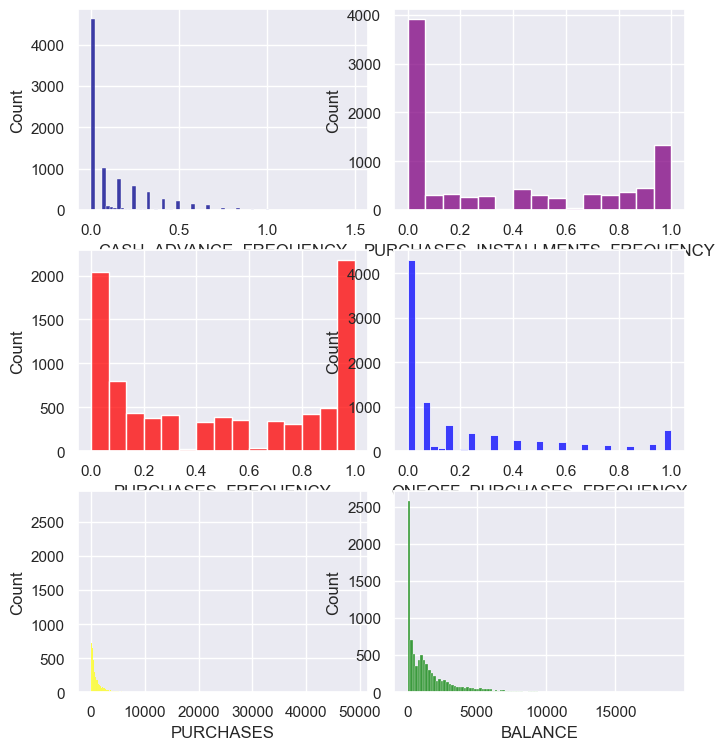

In [155]:
sns.set(rc={'figure.figsize':(16,12)})
ax1 = plt.subplot2grid((4,8), (0,1), colspan=2)
ax2 = plt.subplot2grid((4,8), (0,3), colspan=2)
ax3 = plt.subplot2grid((4,8), (1,1), colspan=2)
ax4 = plt.subplot2grid((4,8), (1,3), colspan=2)
ax5 = plt.subplot2grid((4,8), (2,1), colspan=2)
ax6 = plt.subplot2grid((4,8), (2,3), colspan=2)
sns.set_theme(palette="Accent")
sns.histplot(data = credit_data,x = "PURCHASES",ax=ax5, color='yellow')
sns.histplot(data = credit_data,x = "PURCHASES_FREQUENCY",ax=ax3, color='red')
sns.histplot(data = credit_data,x = "BALANCE",ax=ax6, color='green')
sns.histplot(data = credit_data,x = "ONEOFF_PURCHASES_FREQUENCY",ax=ax4, color='blue')
sns.histplot(data = credit_data,x = "CASH_ADVANCE_FREQUENCY",ax=ax1, color='darkblue')
sns.histplot(data = credit_data,x = "PURCHASES_INSTALLMENTS_FREQUENCY",ax=ax2, color='purple');

In [156]:
px.scatter(data_frame = credit_data
           ,x = 'PURCHASES'
           ,y = 'PURCHASES_FREQUENCY'
           ,color = 'CUST_ID'
           )

# *Cluster Analysis*
### *6)Step-by-step hierarchical clustering:*
import agglomerativeclustering from sklearn.cluster.Then the select two column credit_limit and payments for clustring.then fit to the cluster.Build four cluster df1, df2,df3, df4.Lastly, plot the scatter plot for the four different clusters and it is represented by different colors.


## *7)Dendogram*

for plot the dendogram import dendrogram,linkage and leaves_ list from the scipy cluster hierarchy.We take sample data to plot the dendogram to allocate objects to clusters in dendogram.

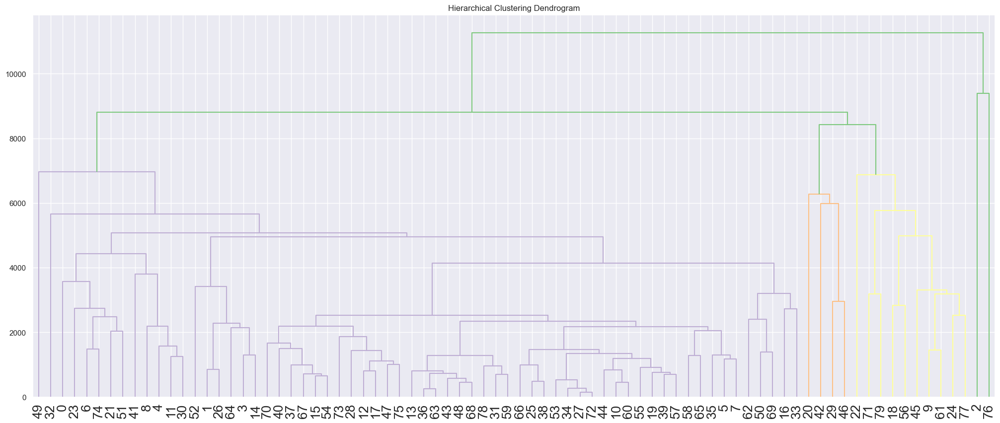

In [157]:
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list
Z = linkage(u_updated_credit_data.sample(80), 'average')


plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
dendrogram(Z, leaf_font_size = 19.)
plt.show()

# *8)Unsupervised Clustering*

decide to use 3 centroid for the data and select random points.plot the scatter plot for the credit card  limit and payments columns.and plot the 3 centroid in the scatter plot. import make_blobs from sklearn.cluster.make blobs with sample of 120 and with the centers of 4.For finding kmenas import KMenas from sklearn.cluster.select the numeric columns from the data.plot the KMeans classification  using the scatter plot for the purchases and purchases frequency.print four different clusters of the KMeans.

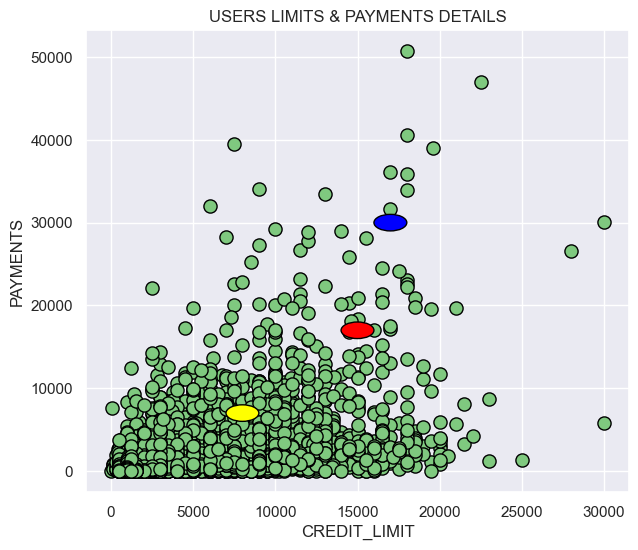

In [158]:
fig = plt.figure(figsize=(7,6))

plt.scatter(credit_data.CREDIT_LIMIT, credit_data.PAYMENTS, edgecolor = 'black', s = 90)
plt.title('USERS LIMITS & PAYMENTS DETAILS')
plt.xlabel('CREDIT_LIMIT')
plt.ylabel('PAYMENTS')
circle1 = plt.Circle(centroid1, radius=1000, edgecolor = 'black', fc='yellow')
circle2 = plt.Circle(centroid2, radius=1000, edgecolor = 'black', fc='red')
circle3 = plt.Circle(centroid3, radius=1000, edgecolor = 'black', fc='blue')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

# *9)sklearn.cluster*

import cluster and metrics from sklearn.import KNeighborsClassifier from sklearn.neighbors.find the kmeans of the clusters for 4 clusters.fit the kmeans with purchases and purchses frequency.Find the sklearn cluster with the cluster center and plot the scatter plot for purchases installment frequency and cash advance frequency for the difference ranges of balances.

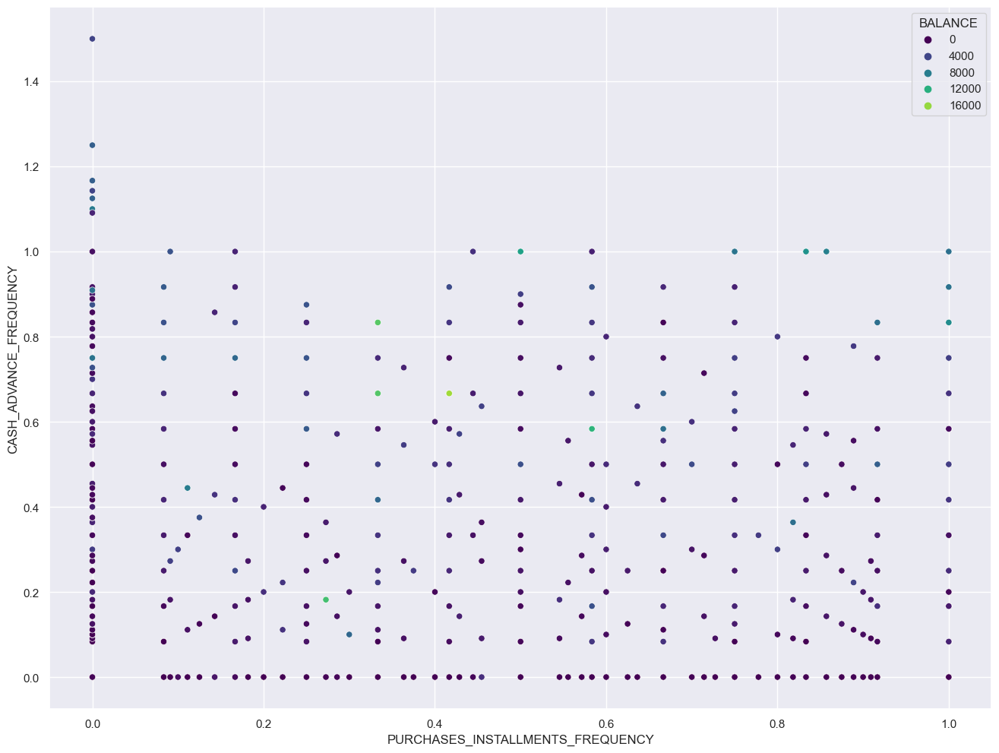

In [159]:
sns.scatterplot(x="PURCHASES_INSTALLMENTS_FREQUENCY", y="CASH_ADVANCE_FREQUENCY", hue = 'BALANCE',  data=x, palette='viridis');

## *10) KNN algorithm*
import essential library such as matplotlib, KMeans and sklearn metrics.convert purchase frequency into the 0,1,2,3 for plotting knn plot.Plot the scatter plot of the credit limit and purchases.

Text(0, 0.5, 'Purchases')

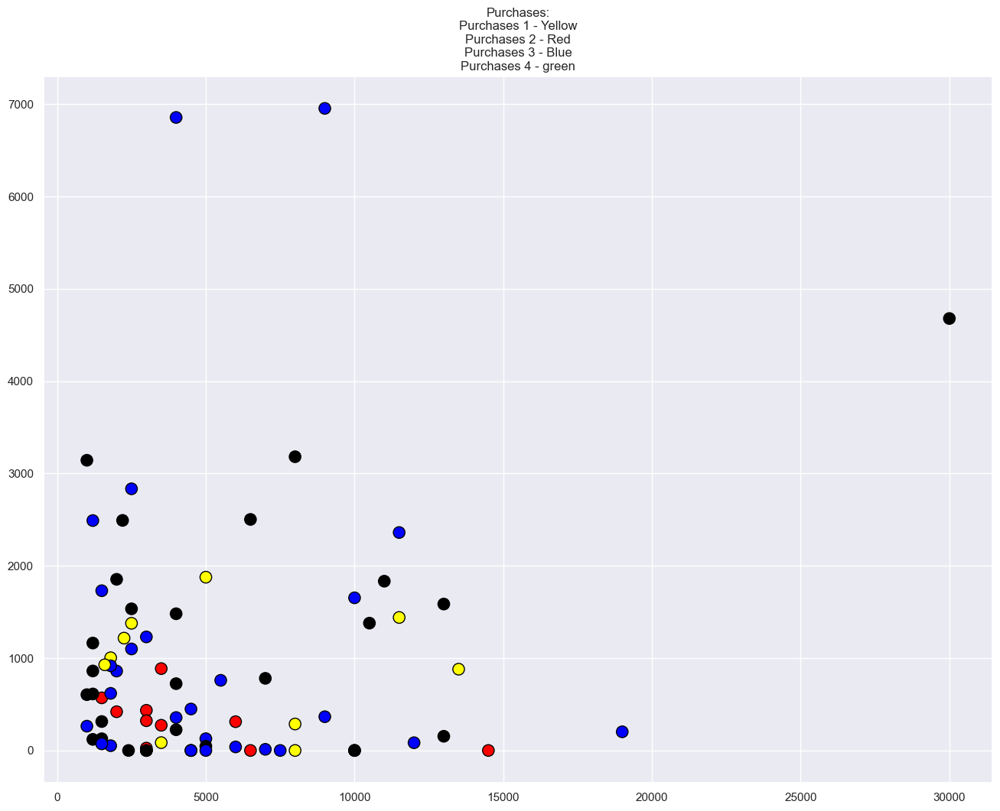

In [160]:
colormap = np.array(['black', 'yellow', 'red', 'blue', 'green'])
 
plt.scatter(credit_data.sample(80).CREDIT_LIMIT,credit_data.sample(80).PURCHASES, 
            c = colormap[credit_data.sample(80).convert_purchase], edgecolor = 'black', s = 120)
plt.title('Purchases:\nPurchases 1 - Yellow\nPurchases 2 - Red\nPurchases 3 - Blue\nPurchases 4 - green')
ax = fig.add_subplot(111)
ax.set_xlabel('Credit Limit')
ax.set_ylabel('Purchases')

## Originality 
Originality of the project - This dataset was not created by us rather it was imported from Kaggle "https://www.kaggle.com/datasets/arjunbhasin2013/ccdata?resource=download" . We did not refer or copy anyones work from the internet. But, there might be some scenarios where we could have used the same variables to predict the similar output as others on the web and also could have used the same visualization to present our graphs. All the notebooks that we came across were coded in python language hence different approach to dataset as the library used also differs to some extent. Although we reached to stack overflow and other multiple website for reference, this work solely belongs to us.